# Create validation and train dataset

In [78]:
import os
import zipfile
import shutil
import numpy as np
import glob
import random
import pandas as pd
import cv2
import tensorflow as tf
import keras_preprocessing
from keras_preprocessing import image
from keras_preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix,accuracy_score, classification_report
import matplotlib.cm as cmcol
from sklearn.metrics import confusion_matrix,accuracy_score
from sklearn.model_selection import train_test_split

#Dataset 1
# fire_dir = glob.glob('Data/fire_dataset/fire_images/*.png')
# non_fire_dir = glob.glob('Data/fire_dataset/non_fire_images/*.png')

#Dataset 2
# fire_dir = glob.glob('Data/Fire-Detection/1/*')
# non_fire_dir = glob.glob('Data/Fire-Detection/0/*')

#Dataset 3
fire_dir = glob.glob('Data/FIRE-SMOKE-DATASET/train/Fire/*')
non_fire_dir = glob.glob('Data/FIRE-SMOKE-DATASET/train/Neutral/*')

def generate_dataframe(fire_dir,non_fire_dir):
    fire_df = []
    non_fire_df = []
    for i in fire_dir:
        fire_df.append([i,'fire'])
    for j in non_fire_dir:
        non_fire_df.append([j,'non-fire'])
    df = fire_df + non_fire_df
    random.shuffle(df)
    data_df = pd.DataFrame(df, columns = ['path','label'])
    return data_df

data_df = generate_dataframe(fire_dir,non_fire_dir)

In [2]:
data_df.head()
# data_df.size

,path,label
0,Data/FIRE-SMOKE-DATASET/train/Fire\image_805.jpg,fire
1,Data/FIRE-SMOKE-DATASET/train/Neutral\image_24...,non-fire
2,Data/FIRE-SMOKE-DATASET/train/Neutral\image_49...,non-fire
3,Data/FIRE-SMOKE-DATASET/train/Fire\image_127.jpg,fire
4,Data/FIRE-SMOKE-DATASET/train/Neutral\image_55...,non-fire


# Gather data and label them

In [52]:
datagen=ImageDataGenerator(rescale=1./255.,
                           validation_split=0.25,
                           height_shift_range=0.2,
                           width_shift_range=0.2,
                           horizontal_flip=True)

train_generator = datagen.flow_from_dataframe(data_df,
                                              x_col='path',
                                              y_col='label',
                                              color_mode='rgb',
                                              images_size=(256,256),
                                              class_mode='binary',
                                              subset='training')

validation_generator = datagen.flow_from_dataframe(data_df,
                                                   x_col='path',
                                                   y_col='label',
                                                   color_mode='rgb',
                                                   images_size=(256,256),
                                                   class_mode='binary',
                                                   subset='validation')

Found 1350 validated image filenames belonging to 2 classes.
Found 450 validated image filenames belonging to 2 classes.


# Model Implementation 

## My custom model

In [4]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
from keras.layers import Dense, Activation, Flatten, Dropout

def custom_model():
  model = models.Sequential([
      
    layers.Conv2D(32, kernel_size = (3,3), padding='same', activation='relu', input_shape=(256,256,3)),
    layers.MaxPooling2D(),
      
    layers.Conv2D(64, kernel_size = (3,3), padding='same', activation='relu'),
    layers.MaxPooling2D(),
      
    layers.Conv2D(64, kernel_size = (3,3), padding='same', activation='relu'),
    layers.MaxPooling2D(),

    layers.Conv2D(64, kernel_size = (3,3), padding='same', activation='relu'),
    layers.MaxPooling2D(),
      
    layers.Conv2D(64, kernel_size = (3,3), padding='same', activation='relu'),
    layers.MaxPooling2D(),

    layers.Flatten(),
    layers.Dense(60, activation='relu'),
    layers.Dense(1, activation='sigmoid')
  ])
  model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['acc'])
  return model


## Transfer Learning from InceptionV3 Keras

In [5]:
from tensorflow.keras import Model
from tensorflow.keras.optimizers import RMSprop, Adam
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.preprocessing.image import ImageDataGenerator

def preTrainedInceptionV3():
  inception_v3 = InceptionV3(input_shape=(256,256,3),
                           weights='imagenet',
                           include_top=False)
  inception_v3.trainable = False
  
  x = layers.Flatten()(inception_v3.output)
  x = layers.BatchNormalization()(x)
  x = layers.Dense(1024,activation='relu')(x)
  x = layers.Dropout(0.2)(x)                  
  x = layers.Dense(1,activation='sigmoid')(x)           

  model = Model(inception_v3.input, x) 

  model.compile(optimizer = Adam(lr=0.0001), 
               loss = 'binary_crossentropy', 
               metrics =['acc'])
  return model


## Transfer Learning from EfficentNetB0 Keras

In [6]:
from tensorflow.keras.applications import EfficientNetB0

def preTrainedEfficienNet():
    efficientnet_b0 = EfficientNetB0(include_top=False,
                                weights="imagenet",
                                input_shape=(256,256,3))
    efficientnet_b0.trainable = False
    
    x = layers.Flatten()(efficientnet_b0.output)
    x = layers.BatchNormalization()(x)
    x = layers.Dense(1024,activation='relu')(x)
    x = layers.Dropout(0.2)(x)                  
    x = layers.Dense(1,activation='sigmoid')(x)           

    model = Model(efficientnet_b0.input, x) 

    model.compile(optimizer = Adam(lr=0.0001), 
                loss = 'binary_crossentropy', 
                metrics =['acc'])
    return model

## Transfer Learning from MobileNetV2 keras

In [7]:
from tensorflow.keras.applications import MobileNetV2

def preTrainedMobileNetV2():
    
    # Load the pretained model
    pretrained_model = tf.keras.applications.MobileNetV2(
        input_shape=(256, 256, 3),
        include_top=False,
        weights='imagenet',
        pooling='avg'
    )
    pretrained_model.trainable = False
    
    inputs = pretrained_model.input

    x = tf.keras.layers.Dense(128, activation='relu')(pretrained_model.output)
    x = tf.keras.layers.Dense(128, activation='relu')(x)

    outputs = tf.keras.layers.Dense(1, activation='softmax')(x)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)

    model.compile(
        optimizer='adam',
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model


## Model Selection

In [8]:
# model = custom_model()
model = preTrainedInceptionV3()
# model = preTrainedEfficienNet()
# model = preTrainedMobileNetV2()

c:\Users\CL9\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [9]:
# model.summary()

In [10]:
# from tensorflow.keras.callbacks import ReduceLROnPlateau
# learning_rate_reduction = ReduceLROnPlateau(monitor='val_accuracy', patience = 2, verbose=1,factor=0.5, min_lr=0.00001)
# history = model.fit(
#     train_generator,
#     validation_data=validation_generator,
#     batch_size = 32,
#     epochs=5,
#     callbacks=[
#         tf.keras.callbacks.EarlyStopping(
#             monitor='val_loss',
#             patience=2,
#             restore_best_weights=True),
#             learning_rate_reduction
#     ]
# )

history = model.fit(train_generator, validation_data=validation_generator, epochs=20)

Epoch 1/20
43/43 [==============================] - 114s 3s/step - loss: 0.3601 - acc: 0.9333 - val_loss: 0.4248 - val_acc: 0.9444
Epoch 2/20
43/43 [==============================] - 110s 3s/step - loss: 0.1325 - acc: 0.9741 - val_loss: 0.1408 - val_acc: 0.9822
Epoch 3/20
43/43 [==============================] - 110s 3s/step - loss: 0.1164 - acc: 0.9815 - val_loss: 0.1968 - val_acc: 0.9778
Epoch 4/20
43/43 [==============================] - 110s 3s/step - loss: 0.1830 - acc: 0.9800 - val_loss: 0.2416 - val_acc: 0.9733
Epoch 5/20
43/43 [==============================] - 110s 3s/step - loss: 0.1704 - acc: 0.9770 - val_loss: 0.2080 - val_acc: 0.9756
Epoch 6/20
43/43 [==============================] - 109s 3s/step - loss: 0.1633 - acc: 0.9822 - val_loss: 0.0559 - val_acc: 0.9889
Epoch 7/20
43/43 [==============================] - 109s 3s/step - loss: 0.1585 - acc: 0.9881 - val_loss: 0.2392 - val_acc: 0.9756
Epoch 8/20
43/43 [==============================] - 109s 3s/step - loss: 0.1601 - a

# Loss function plots

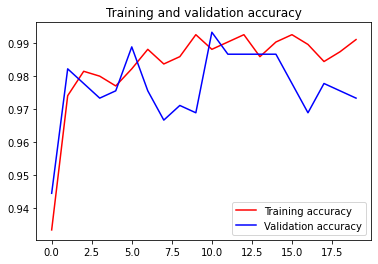

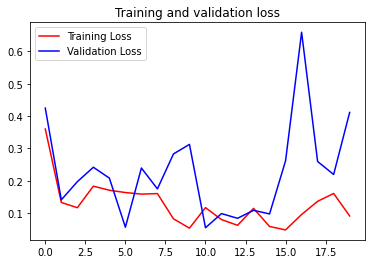

In [12]:
%matplotlib inline
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.plot(epochs, loss, 'r', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

# Saving and Loading model

In [71]:
##  Calling `save('my_model')` creates a SavedModel folder `my_model`.
# model.save('Saved Models/InceptionV3_pretrained.h5')

# # It can be used to reconstruct the model identically.
# reconstructed_model = keras.models.load_model('Saved Models/InceptionV3_pretrained.h5')

# Model Prediction

In [13]:
## Dataset 1
# fire_test_dir = glob.glob('Data/Fire-Detection/1/*')
# non_fire_test_dir = glob.glob('Data/Fire-Detection/0/*')

# ## Dataset 2
# fire_test_dir = glob.glob('Data/fire_dataset/fire_images/*.png')
# non_fire_test_dir = glob.glob('Data/fire_dataset/non_fire_images/*.png')

## Dataset 3
fire_test_dir = glob.glob('Data/FIRE-SMOKE-DATASET/test/Fire/*')
non_fire_test_dir = glob.glob('Data/FIRE-SMOKE-DATASET/test/Neutral/*')

test_data_df = generate_dataframe(fire_test_dir,non_fire_test_dir)
print(test_data_df.size)


test_datagen = ImageDataGenerator(rescale = 1./255,
                                  horizontal_flip=True,
                                  rotation_range=30,
                                  height_shift_range=0.2,
                                  fill_mode='nearest')

# # From mobilenet_v2
# test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
#     preprocessing_function=tf.keras.applications.mobilenet_v2.preprocess_input
# )

test_generator = test_datagen.flow_from_dataframe(test_data_df,
                                              x_col='path',
                                              y_col='label',
                                              color_mode='rgb',
                                              images_size=(256,256),
                                              class_mode='binary',
                                              batch_size=32,
                                              shuffle=False
                                              )

predictions = model.predict(test_generator)

400
Found 200 validated image filenames belonging to 2 classes.
7/7 [==============================] - 13s 2s/step


In [41]:
# Flip predictions
predictions_fliped = [0 if x == 1 else 1 for x in predictions]

In [72]:
actual_y = test_data_df['label'].apply(lambda x: 1 if x in ('fire') else 0)

## A sample of Predicted vs Actual labels to check results

In [44]:
n =20
print("Predicted vs Actual")
for i in range(n):
    print("|{:.3f}".format(predictions_fliped[i]),"    |   ",actual_y[i],"|") 

Predicted vs Actual
|1.000     |    1 |
|0.000     |    0 |
|0.000     |    0 |
|0.000     |    0 |
|0.000     |    0 |
|1.000     |    0 |
|1.000     |    1 |
|0.000     |    0 |
|0.000     |    0 |
|0.000     |    0 |
|1.000     |    1 |
|1.000     |    1 |
|1.000     |    1 |
|0.000     |    0 |
|1.000     |    1 |
|0.000     |    0 |
|1.000     |    1 |
|0.000     |    0 |
|1.000     |    1 |
|0.000     |    0 |


In [73]:
# Applying threshold for results
predicted= []

for i in predictions_fliped:
    if i >0.5:
        predicted.append(1)
    else:
        predicted.append(0)

# Confusion Matrix 

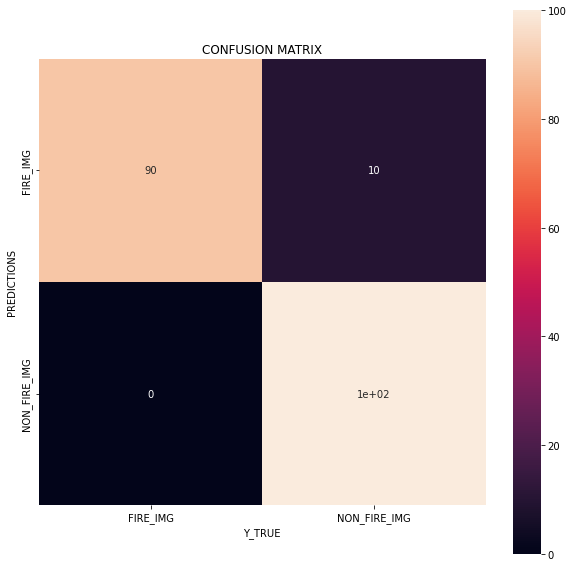

In [74]:
import seaborn as sns

cm = tf.math.confusion_matrix(labels=actual_y,predictions=predicted)
plt.figure(figsize=(10,10))
sns.heatmap(cm, square=True, annot=True,
            yticklabels=['FIRE_IMG', 'NON_FIRE_IMG'],
            xticklabels=['FIRE_IMG', 'NON_FIRE_IMG']);
plt.title('CONFUSION MATRIX');
plt.xlabel('Y_TRUE');
plt.ylabel("PREDICTIONS");

## Classification Results

In [76]:
print(classification_report(predicted,actual_y))

              precision    recall  f1-score   support

           0       0.90      1.00      0.95        90
           1       1.00      0.91      0.95       110

    accuracy                           0.95       200
   macro avg       0.95      0.95      0.95       200
weighted avg       0.95      0.95      0.95       200



# Grad-CAM class activation visualization for interpreting last layers

In [79]:
def get_img_array(img_path, size):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    array = tf.keras.preprocessing.image.img_to_array(img)
    # We add a dimension to transform our array into a "batch"
    # of size "size"
    array = np.expand_dims(array, axis=0)
    return array

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def save_and_display_gradcam(img_path, heatmap, cam_path="cam.jpg", alpha=0.4):
    # Load the original image
    img = tf.keras.preprocessing.image.load_img(img_path)
    img = tf.keras.preprocessing.image.img_to_array(img)

    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cmcol.get_cmap("jet")

    # Use RGB values of the colormap
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = tf.keras.preprocessing.image.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.preprocessing.image.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = tf.keras.preprocessing.image.array_to_img(superimposed_img)

    # Save the superimposed image
    superimposed_img.save(cam_path)

    # Display Grad CAM
#     display(Image(cam_path))
    
    return cam_path
    

## Display the part of the pictures used by the neural network to classify the pictures

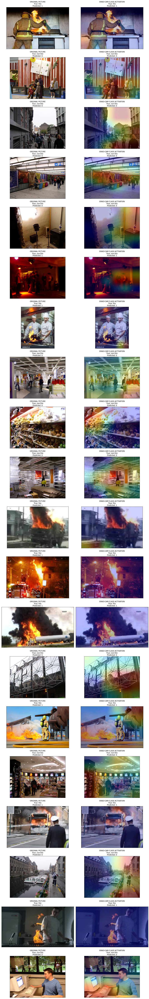

In [88]:
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input
decode_predictions = tf.keras.applications.mobilenet_v2.decode_predictions

last_conv_layer_name = "conv2d_93"
img_size = (256,256)

# Remove last layer's softmax
model.layers[-1].activation = None

nrows = 20 # Num of photos to present
fig, axes = plt.subplots(nrows=nrows, ncols=2, figsize=(15, 5 * nrows),
                        subplot_kw={'xticks': [], 'yticks': []})

i = 0
for i, nrow in enumerate(range(nrows)):
    
    img_path = test_data_df.path.iloc[i]
    title = f"True: {test_data_df.label.iloc[i]}\nPredicted: {predicted[i]}"
    
    # Original Picture
    img = image.load_img(img_path)
    axes[nrow,0].imshow(img)
    axes[nrow,0].set_title('ORIGINAL PICTURE\n' + title)
    
    # Calculate Grad-CAM class activation
    img_array = preprocess_input(get_img_array(img_path, size=img_size))
    
    # Put last convolution layer for geting the gradcam
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)
    cam_path = save_and_display_gradcam(img_path, heatmap)
    img = plt.imread(cam_path)
    axes[nrow,1].imshow(img)
    axes[nrow,1].set_title('GRAD-CAM CLASS ACTIVATION\n' + title)

plt.tight_layout()
plt.show()

# Presenting different results

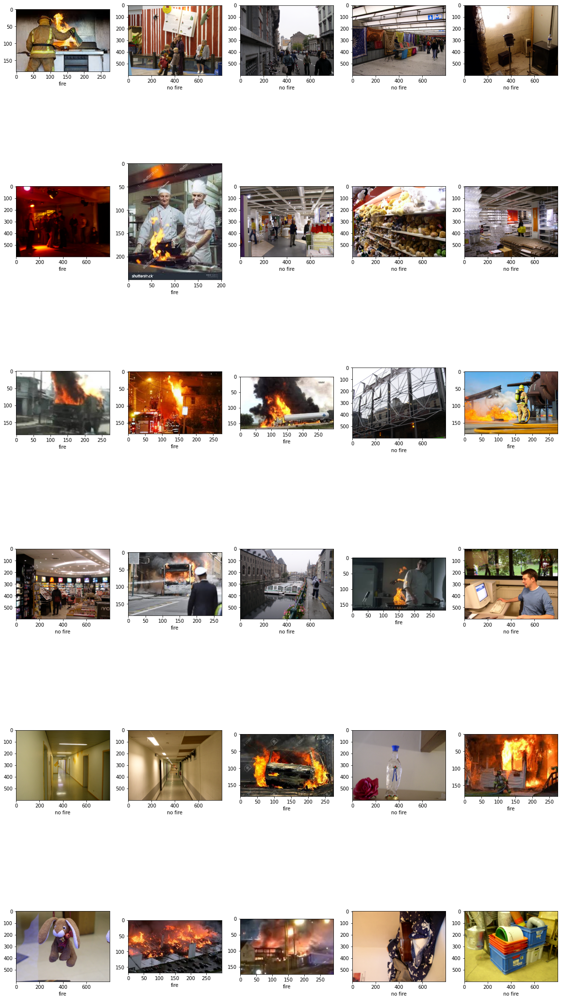

In [89]:
plt.figure(figsize=(20,40))

category = ["no fire","fire"]

for i in range(30):
    plt.subplot(6,5,i+1)
    plt.imshow(cv2.imread(test_data_df.loc[i].path)[:,:,::-1])
    plt.xlabel(category[predicted[i]])